In [2]:
from pathlib import Path
import matplotlib.pyplot as plt
import librosa.display
import numpy as np

In [3]:
data_directory = Path.cwd().parent / "data"
genres_dir = data_directory / "genres"

genres = {
    genre_dir.name: list(genre_dir.glob("*.wav"))
    for genre_dir in genres_dir.iterdir()
    if genre_dir.is_dir()
}

# Spectrogram

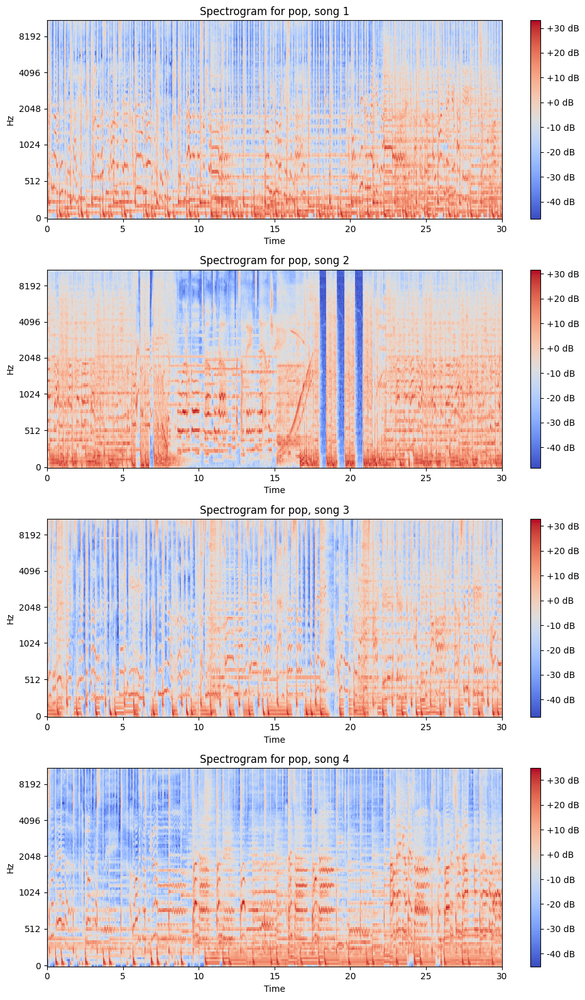

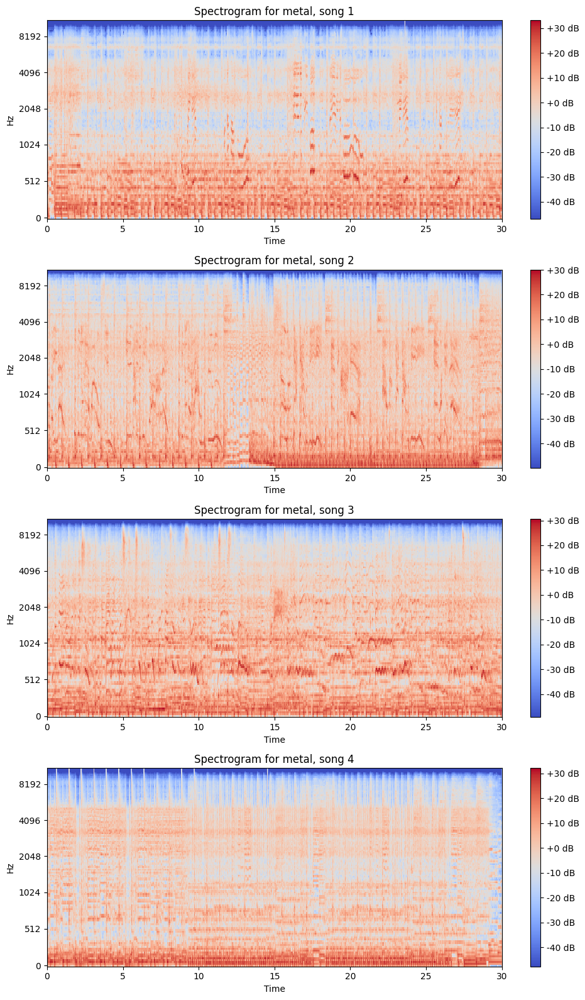

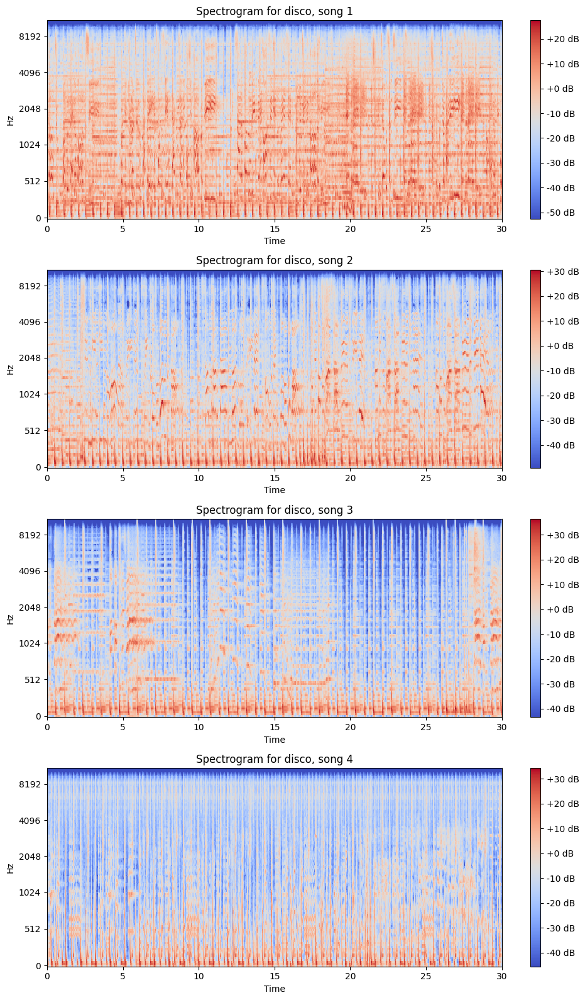

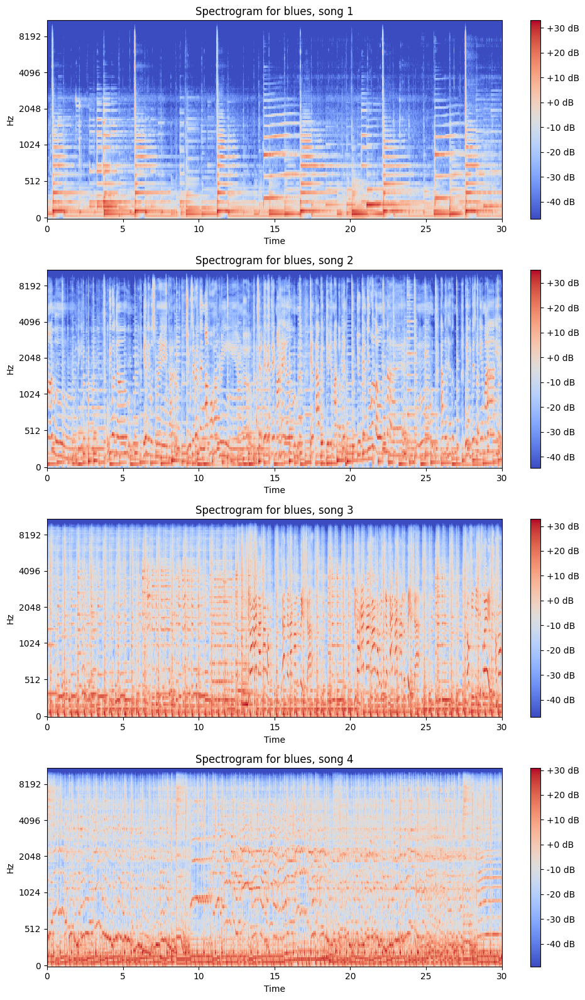

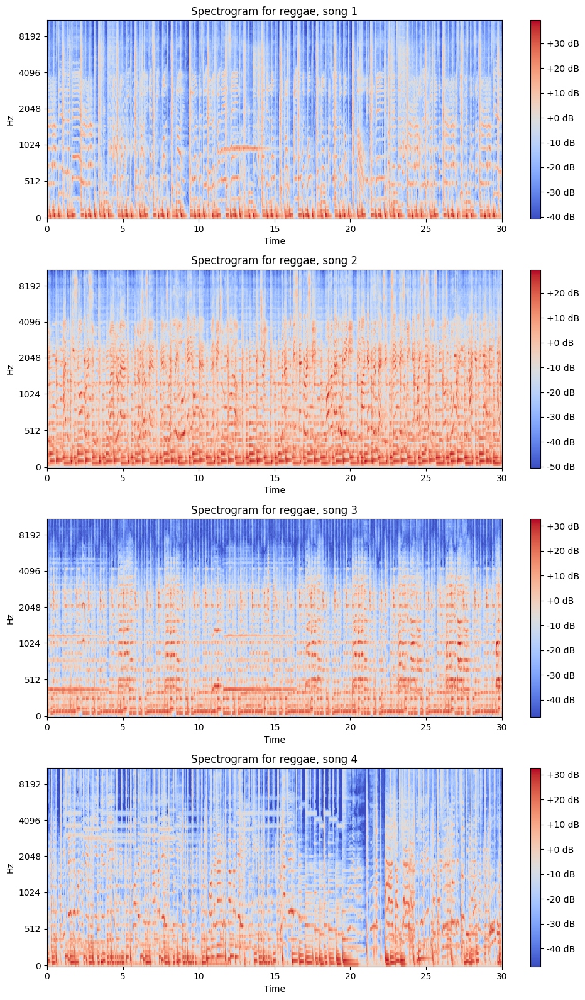

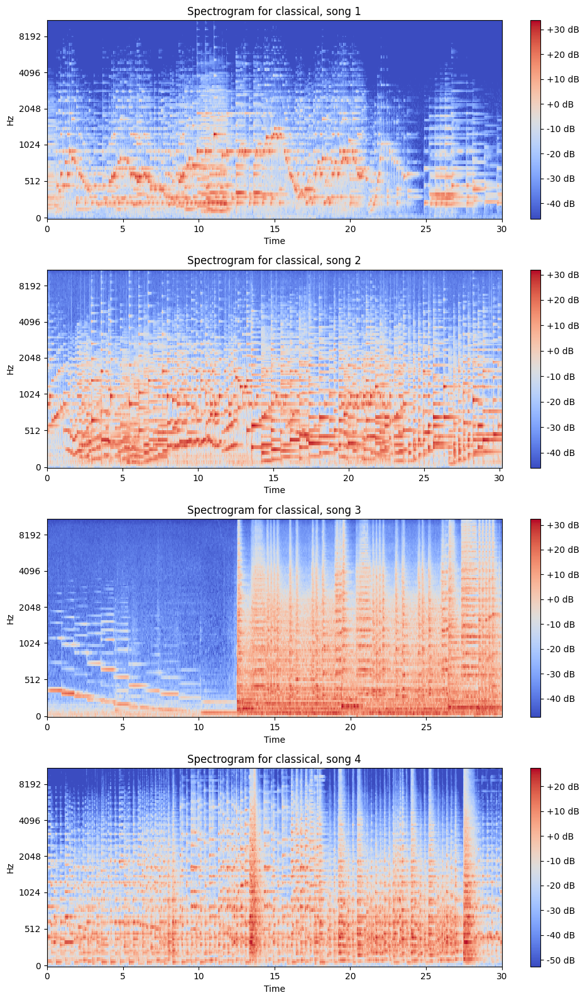

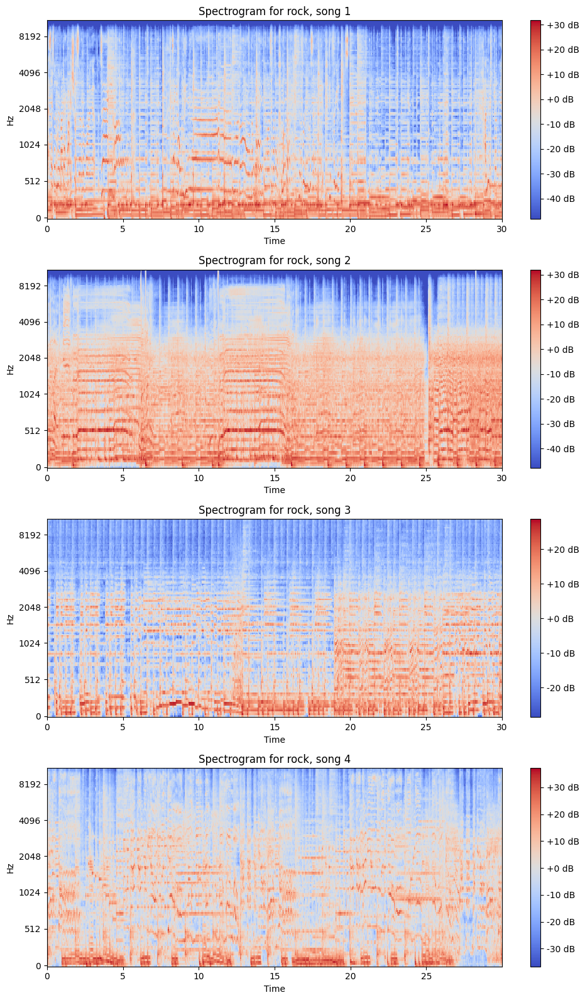

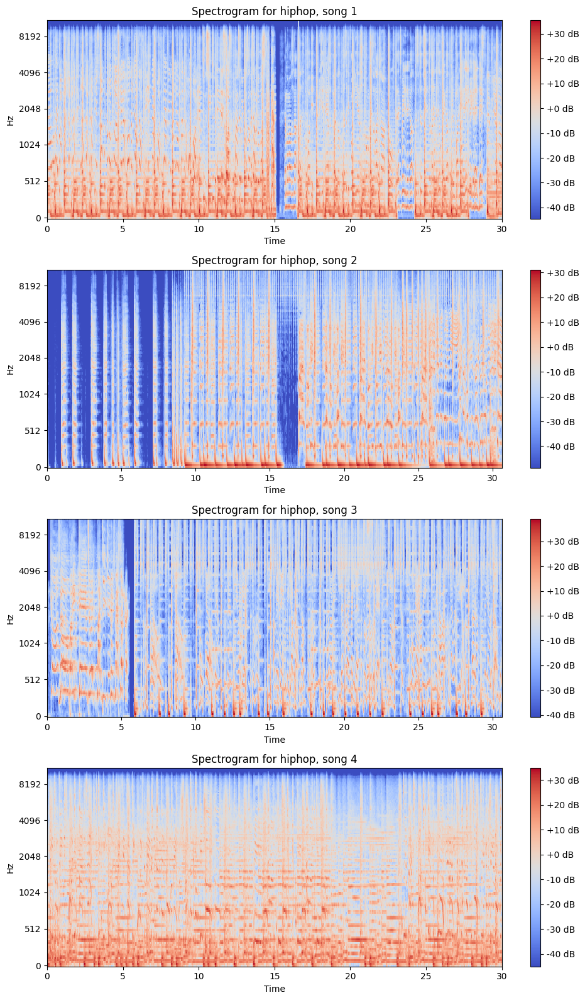

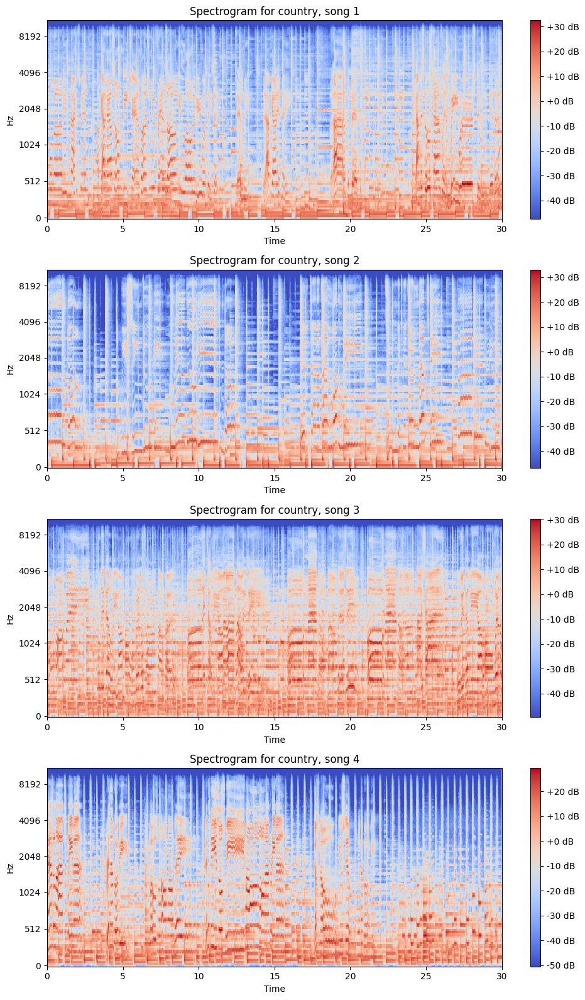

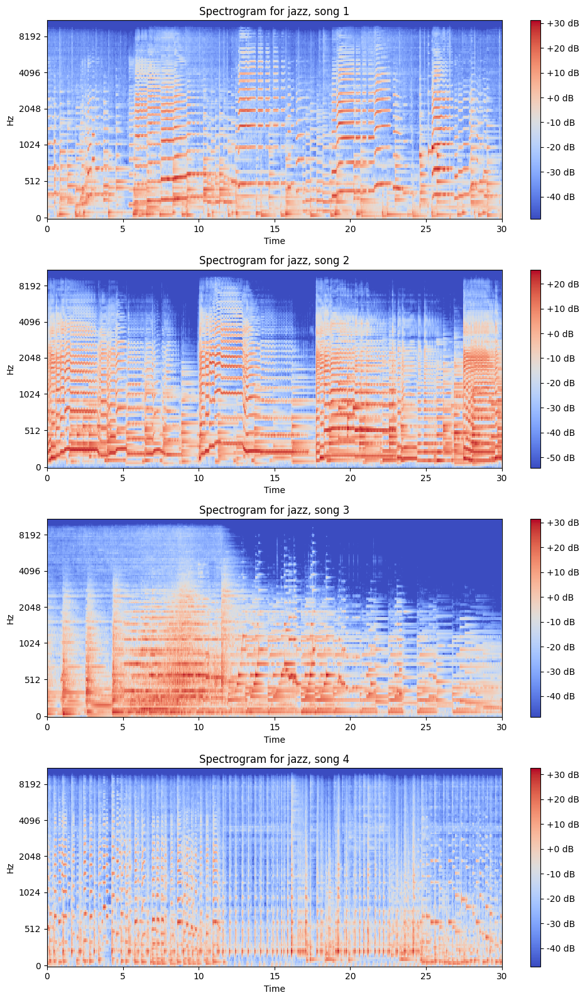

In [4]:
# Define the number of songs to plot per genre
num_songs = 4

# Iterate over all genres
for genre, paths in genres.items():
    # Create a new figure for each genre
    plt.figure(figsize=(10, 4 * num_songs))
    
    for i in range(num_songs):
        # Load the i-th audio file of the genre
        signal, sr = librosa.load(paths[i])

        # Normalize the signal
        signal = librosa.util.normalize(signal)

        # Compute the spectrogram
        spectrogram = librosa.feature.melspectrogram(y=signal)
        spectrogram = librosa.power_to_db(spectrogram)

        # Create a subplot for this song
        plt.subplot(num_songs, 1, i + 1)
        librosa.display.specshow(spectrogram, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Spectrogram for {genre}, song {i + 1}')

    # Show the figure
    plt.tight_layout()
    plt.show()

# FFT

In [ ]:
# Define the number of songs to plot per genre
num_songs = 4

# Iterate over all genres
for genre, paths in genres.items():
    # Create a new figure for each genre
    plt.figure(figsize=(10, 4 * num_songs))
    
    for i in range(num_songs):
        # Load the i-th audio file of the genre
        signal, sr = librosa.load(paths[i])

        # Normalize the signal
        signal = librosa.util.normalize(signal)

        # Compute the FFT
        fft = np.fft.fft(signal)

        # Compute the frequencies corresponding to the FFT values
        frequencies = np.linspace(0, sr, len(fft))

        # Create a subplot for this song
        plt.subplot(num_songs, 1, i + 1)
        plt.plot(frequencies[:int(len(frequencies)/2)], np.abs(fft)[:int(len(fft)/2)])  # We only plot the first half of the frequencies, as the second half is a mirror image of the first half for real signals.
        plt.title(f'FFT for {genre}, song {i + 1}')

    # Show the figure
    plt.tight_layout()
    plt.show()

# Raw Audio

In [ ]:
# Define the number of songs to plot per genre
num_songs = 4

# Iterate over all genres
for genre, paths in genres.items():
    # Create a new figure for each genre
    plt.figure(figsize=(10, 4 * num_songs))
    
    for i in range(num_songs):
        # Load the i-th audio file of the genre
        signal, sr = librosa.load(paths[i])

        # Normalize the signal
        signal = librosa.util.normalize(signal)

        # Compute the time axis
        time = np.arange(0, len(signal)) / sr

        # Create a subplot for this song
        plt.subplot(num_songs, 1, i + 1)
        plt.plot(time, signal)
        plt.title(f'Raw audio signal for {genre}, song {i + 1}')

    # Show the figure
    plt.tight_layout()
    plt.show()

# Chroma Analysis

In [ ]:
# Define the number of songs to plot per genre
num_songs = 4

# Define the note labels
note_labels = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']

# Iterate over all genres
for genre, paths in genres.items():
    # Create a new figure for each genre
    plt.figure(figsize=(10, 4 * num_songs))
    
    for i in range(num_songs):
        # Load the i-th audio file of the genre
        signal, sr = librosa.load(paths[i])

        # Normalize the signal
        signal = librosa.util.normalize(signal)

        # Compute the chroma feature
        chroma = librosa.feature.chroma_stft(y=signal, sr=sr)

        # Create a subplot for this song
        plt.subplot(num_songs, 1, i + 1)
        librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
        
        # Set the y-axis labels to note labels
        plt.yticks(range(12), note_labels)
        
        plt.title(f'Chroma feature for {genre}, song {i + 1}')

    # Show the figure
    plt.tight_layout()
    plt.show()

# MFCC

In [ ]:
# Define the number of songs to plot per genre
num_songs = 4

# Iterate over all genres
for genre, paths in genres.items():
    # Create a new figure for each genre
    plt.figure(figsize=(10, 4 * num_songs))
    
    for i in range(num_songs):
        # Load the i-th audio file of the genre
        signal, sr = librosa.load(paths[i])

        # Normalize the signal
        signal = librosa.util.normalize(signal)

        # Compute the MFCCs
        mfccs = librosa.feature.mfcc(y=signal, sr=sr)

        # Create a subplot for this song
        plt.subplot(num_songs, 1, i + 1)
        librosa.display.specshow(mfccs, sr=sr, x_axis='time', y_axis='mel')
        
        # Set the y-axis label to 'MFCC coefficients'
        plt.ylabel('MFCC coefficients')
        
        plt.title(f'MFCCs for {genre}, song {i + 1}')

    # Show the figure
    plt.tight_layout()
    plt.show()
